# Introduction

In our project we explore and analyze the correlation between heart disease mortality rates and many different behavioral and environmental factors. We hope to discover how the things in our control (such as exercise and smoking) and things out of our control (gender and certain health problems) are related to the cardiovascular mortalities in the US.

In particular we hope to answer the following questions:
* Does gender or ethnicity play a role in heart-related deaths?
* Do heart-related deaths cluster in certain parts of the US?
* Can we use income data to explain how cardiovascular mortalities scatter throughout the US?
* What are the highest correlated features of CDC survey participants with the mortalities and do they follow a similar pattern of geographical clusters formed by death statistics?



# Data Importing, Cleaning, Imputing, and Manipulation


Installing the required packages:

In [ ]:
#Kindly note:

# We have included the requirements.txt in our data folder so that the !pip install -r requirements.txt command would work if
# you are using the data folder as the directory, although it seems that running the file is not necessary.
# Also, our code downloads the files from the internet and places them into the current directory folder so the data
# files we provided in the .zip are not necessary. We have also tried our best to follow Pep 8 guidelines. Google Colab
# does have a wider screen than jupyter notebook so some of our code is a little wide for jupyter but it looks fine in Jupyter
# and great in Google colab :). Lastly, we were told that the error after importing was ok by our counselor as it does not impact code.
# We hope that our documentation process is accessible enough to understand. Thanks for reading!


!pip install altair==5.1.2 jsonschema==4.17.3 vega==1.3
!pip install -r requirements.txt
!pip install vega-datasets


Importing the usual suspects and adjusting a few visualization settings:

In [ ]:
import os
import requests
from zipfile import ZipFile
from urllib.request import urlretrieve
import pandas as pd
import numpy as np
import csv
import altair as alt
from vega_datasets import data
from math import cos, asin, sqrt
from sklearn.neighbors import BallTree
%matplotlib inline
import seaborn as sns
sns.set()
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
import statsmodels.api as sm
alt.data_transformers.disable_max_rows()
from sklearn.feature_selection import RFECV
from sklearn.ensemble import RandomForestRegressor
from scipy.stats import t
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import PolynomialFeatures
pd.set_option('display.max_columns', None)

In [ ]:
def download_file(download_f, filename, force=False):
    """
    Downloads a file using a dynamic function.

    :param download_f: Function to be used for the actual download operation
    :param filename: File name for saving
    :param force: Whether to overwrite an existing file
    """
    if force or not os.path.exists(filename):
        download_f(filename)


In [ ]:
def download_annual_personal_income_by_county(filename):
    """
    Downloads the personal income dataset and extracts it.

    :param filename: File name for saving
    """
    def download(filename):
        """
        Actual download logic for the personal income dataset

        :param filename: File name for saving
        """
        url = 'https://apps.bea.gov/regional/downloadzip.cfm'
        payload = {
          'selFilename': 'CAINC1',
          'sbmtButton': 'Download'
          }
        res = requests.post(url, params=payload)
        with open(filename, 'wb') as f:
            f.write(res.content)
    download_file(download, filename)
    with ZipFile(filename, 'r') as zObject:
        zObject.extractall(path='./income_unzipped/')


def download_heart_disease_mortality_by_county(filename):
    """
    Downloads the mortality dataset.

    :param filename: File name for saving
    """
    def download(filename):
        """
        Actual download logic for the personal income dataset

        :param filename: File name for saving
        """
        url = 'https://data.cdc.gov/resource/jiwm-ppbh.csv?$limit=100000'
        urlretrieve(url, filename)
    download_file(download, filename)


def download_cdc_survey(filename):
    """
    Downloads the cdc survey dataset.

    :param filename: File name for saving
    """
    def download(filename):
        """
        Actual download logic for the personal cdc survey dataset

        :param filename: File name for saving
        """
        url = 'https://www.cdc.gov/brfss/annual_data/2022/files/LLCP2022ASC.zip'
        urlretrieve(url, filename)
    download_file(download, filename)
    with ZipFile(filename, 'r') as zObject:
        zObject.extractall(path='./cdc_survey_unzipped/')


Downloading (and extrating if necessary) all three datasets:

In [ ]:
annual_personal_income_by_county_zip_filename = 'CAINC1.zip'
download_annual_personal_income_by_county(annual_personal_income_by_county_zip_filename)

heart_disease_mortality_by_county_csv_filename = 'mortality.csv'
download_heart_disease_mortality_by_county(heart_disease_mortality_by_county_csv_filename)

cdc_survey_zip_filename = 'cdc_survey.zip'
download_cdc_survey(cdc_survey_zip_filename)

In [ ]:
state_code_to_abbr = {
    1: 'AL', 2: 'AK', 4: 'AZ', 5: 'AR', 6: 'CA', 8: 'CO', 9: 'CT', 10: 'DE', 11: 'DC', 12: 'FL', 13: 'GA', 15: 'HI', 16: 'ID', 17: 'IL', 18: 'IN', 19: 'IA', 20: 'KS',
    21: 'KY', 22: 'LA', 23: 'ME', 24: 'MD', 25: 'MA', 26: 'MI', 27: 'MN', 28: 'MS', 29: 'MO', 30: 'MT', 31: 'NE', 32: 'NV', 33: 'NH', 34: 'NJ', 35: 'NM', 36: 'NY',
    37: 'NC', 38: 'ND', 39: 'OH', 40: 'OK', 41: 'OR', 42: 'PA', 44: 'RI', 45: 'SC', 46: 'SD', 47: 'TN', 48: 'TX', 49: 'UT', 50: 'VT', 51: 'VA', 53: 'WA', 54: 'WV', 55: 'WI', 56: 'WY'
    }

def parse_cdc_survey():
  """
  Reads the CDC survey input file and parses the contents using ASCII format.

  :return: CDC survey dataframe.
  """
  rows = []
  with open('./cdc_survey_unzipped/LLCP2022.ASC ', 'r') as f:
    count = 0
    for line in f:
      row = {}
      state_code = int(line[:2])
      interview_completed = line[31:35] == '1100'
      if interview_completed and state_code in state_code_to_abbr:
        row['State Abbr.'] = state_code_to_abbr[state_code]
        row['Interview Year'] = line[22:26]

        age_older_18_landline = line[67]
        if age_older_18_landline == '1':
          row['Is Adult Landline'] = True
        elif age_older_18_landline == '2':
          row['Is Adult Landline'] = False

        gender = line[1979]
        if gender == '1':
          row['Gender'] = 'Male'
        elif gender == '2':
          row['Gender'] = 'Female'

        num_of_adults_landline = line[69:71].strip()
        if num_of_adults_landline:
          row['Num of Adults Landline'] = int(num_of_adults_landline)


        age_older_18_cell = line[80]
        if age_older_18_cell == '1':
          row['Is Adult Cell'] = True

        num_of_adults_cell = line[88:90].strip()
        if num_of_adults_cell and int(num_of_adults_cell) <= 76:
          row['Num of Adults Cell'] = int(num_of_adults_cell)

        general_health = line[100].strip()
        if general_health == '1':
          row['General Health'] = 'Excellent'
        elif general_health == '2':
          row['General Health'] = 'Very good'
        elif general_health == '3':
          row['General Health'] = 'Good'
        elif general_health == '4':
          row['General Health'] = 'Fair'
        elif general_health == '5':
          row['General Health'] = 'Poor'

        health_care_access = line[107:109].strip()
        if health_care_access:
          health_care_access_code = int(health_care_access)
          if health_care_access_code == 1:
            row['Health Care Access'] = 'from_employer'
          elif health_care_access_code == 2:
            row['Health Care Access'] = 'from_own_pocket'
          elif health_care_access_code == 3:
            row['Health Care Access'] = 'medicare'
          elif health_care_access_code == 4:
            row['Health Care Access'] = 'medigap'
          elif health_care_access_code == 5:
            row['Health Care Access'] = 'medicaid'
          elif health_care_access_code == 6:
            row['Health Care Access'] = 'children_health_insurance_program'
          elif health_care_access_code == 7:
            row['Health Care Access'] = 'military'
          elif health_care_access_code == 8:
            row['Health Care Access'] = 'indian_health'
          elif health_care_access_code == 9:
            row['Health Care Access'] = 'state_sponsored'
          elif health_care_access_code == 10:
            row['Health Care Access'] = 'other_government'
          elif health_care_access_code == 88:
            row['Health Care Access'] = 'no_coverage'

        could_afford_doctor = line[110].strip()
        if could_afford_doctor:
          could_afford_doctor_code = int(could_afford_doctor)
          if could_afford_doctor_code == 1:
            row['Could Afford Doctor'] = True
          elif could_afford_doctor_code == 2:
            row['Could Afford Doctor'] = False

        how_many_years_since_last_checkup = line[111].strip()
        if how_many_years_since_last_checkup:
          how_many_years_since_last_checkup_code = int(how_many_years_since_last_checkup)
          if how_many_years_since_last_checkup_code == 1:
            row['Years Since Last Checkup'] = 'within_past_year'
          elif how_many_years_since_last_checkup_code == 2:
            row['Years Since Last Checkup'] = 'within_past_two_years'
          elif how_many_years_since_last_checkup_code == 3:
            row['Years Since Last Checkup'] = 'within_past_five_years'
          elif how_many_years_since_last_checkup_code == 4:
            row['Years Since Last Checkup'] = 'five_or_more_years'

        exercise_in_past_30_days = line[112].strip()
        if exercise_in_past_30_days:
          exercise_in_past_30_days_code = int(exercise_in_past_30_days)
          if exercise_in_past_30_days_code == 1:
            row['Exercise in Past 30 Days'] = True
          elif exercise_in_past_30_days_code == 2:
            row['Exercise in Past 30 Days'] = False

        hours_of_sleeping = line[113:115].strip()
        if hours_of_sleeping:
          hours_of_sleeping_code = int(hours_of_sleeping)
          if hours_of_sleeping_code <= 24:
            row['Hours of Sleeping'] = hours_of_sleeping_code

        how_many_years_since_last_dentist_visit = line[115].strip()
        if how_many_years_since_last_dentist_visit:
          how_many_years_since_last_dentist_visit_code = int(how_many_years_since_last_dentist_visit)
          if how_many_years_since_last_dentist_visit_code == 1:
            row['Years Since Last Dentist Visit'] = 'within_past_year'
          elif how_many_years_since_last_dentist_visit_code == 2:
            row['Years Since Last Dentist Visit'] = 'within_past_two_years'
          elif how_many_years_since_last_dentist_visit_code == 3:
            row['Years Since Last Dentist Visit'] = 'within_past_five_years'
          elif how_many_years_since_last_dentist_visit_code == 4:
            row['Years Since Last Dentist Visit'] = 'five_or_more_years'

        heart_attack = line[117].strip()
        if heart_attack:
          if heart_attack == '1':
            row['Heart Attack'] = True
          elif heart_attack == '2':
            row['Heart Attack'] = False

        heart_disease = line[118].strip()
        if heart_disease:
          if heart_disease == '1':
            row['Heart Disease'] = True
          elif heart_disease == '2':
            row['Heart Disease'] = False

        stroke = line[119].strip()
        if stroke:
          if stroke == '1':
            row['Stroke'] = True
          elif stroke == '2':
            row['Stroke'] = False

        asthma = line[1908].strip()
        if asthma:
          if asthma == '1':
            row['Asthma'] = False
          elif asthma == '2':
            row['Asthma'] = True

        asthma_in_effect = line[1909].strip()
        if asthma_in_effect:
          if asthma_in_effect == '2':
            row['Asthma in Effect'] = True
          elif asthma_in_effect == '1':
            row['Asthma in Effect'] = False

        depression = line[125].strip()
        if depression:
          if depression == '1':
            row['Depression'] = True
          elif depression == '2':
            row['Depression'] = False

        kidney_disease = line[126].strip()
        if kidney_disease:
          if kidney_disease == '1':
            row['Kidney Disease'] = True
          elif kidney_disease == '2':
            row['Kidney Disease'] = False

        arthritis = line[1911].strip()
        if arthritis:
          if arthritis == '1':
            row['Arthritis'] = True
          elif arthritis == '2':
            row['Arthritis'] = False

        diabetes = line[128].strip()
        if diabetes:
          if diabetes == '1':
            row['Diabetes'] = True
          elif diabetes in ['2', '3', '4']:
            row['Diabetes'] = False

        weight_in_pounds = line[188:192].strip()
        if weight_in_pounds:
          weight_in_pounds_code = int(weight_in_pounds)
          if weight_in_pounds_code >= 50 and weight_in_pounds_code <= 776:
            row['Weight in Pounds'] = weight_in_pounds_code

        height_in_inches = line[1986:1989].strip()
        if height_in_inches:
          height_in_inches_code = int(height_in_inches)
          row['Height in Inches'] = height_in_inches_code


        smoking = line[223].strip()
        if smoking:
          if smoking == '1':
            row['Smoking'] = 'every_day'
          elif smoking == '2':
            row['Smoking'] = 'some_days'
          elif smoking == '3':
            row['Smoking'] = 'never'

        cigarettes_per_day = line[232:235].strip()
        if cigarettes_per_day:
          cigarettes_per_day_code = int(cigarettes_per_day)
          if cigarettes_per_day_code <= 300:
            row['Cigarettes per Day'] = cigarettes_per_day_code

        drinks_last_30_day = line[241:243].strip()
        if drinks_last_30_day:
          drinks_last_30_day_code = int(drinks_last_30_day)
          if drinks_last_30_day_code <= 76:
            row['Drinks in Last 30 Days'] = drinks_last_30_day_code

        pre_diabetes = line[269].strip()
        if pre_diabetes:
          if pre_diabetes == '1':
            row['Prediabetes'] = True
          elif pre_diabetes in ['2', '3']:
            row['Prediabetes'] = False

        diabetes = line[270].strip()
        if diabetes:
          if diabetes in ['1', '2']:
            row['Diabetes'] = True

        shortness_of_breath = line[305].strip()
        if shortness_of_breath:
          if shortness_of_breath == '1':
            row['Shortness of Breath'] = True
          elif shortness_of_breath == '2':
            row['Shortness of Breath'] = False

        life_satisfaction = line[360].strip()
        if life_satisfaction:
          if life_satisfaction == '1':
            row['Life Satisfaction'] = 'very_satisfied'
          elif life_satisfaction == '2':
            row['Life Satisfaction'] = 'satisfied'
          elif life_satisfaction == '3':
            row['Life Satisfaction'] = 'dissatisfied'
          elif life_satisfaction == '4':
            row['Life Satisfaction'] = 'very_dissatisfied'

        ethnicity = line[1975].strip()
        if ethnicity:
          if ethnicity == '1':
            row['Ethnicity'] = 'White'
          elif ethnicity == '2':
            row['Ethnicity'] = 'Black'
          elif ethnicity == '3':
            row['Ethnicity'] = 'American Indian and Alaskan Native'
          elif ethnicity in ['4', '5']:
            row['Ethnicity'] = 'Asian and Pacific Islander'
          elif ethnicity == '8':
            row['Ethnicity'] = 'Hispanic'
          elif ethnicity == '7':
            row['Ethnicity'] = 'Multiracial, non-Hispanic'

        metropolitan = line[1401].strip()
        if metropolitan:
          if metropolitan == '1':
            row['Metropolitan'] = True
          elif metropolitan == '2':
            row['Metropolitan'] = False

        age_group = line[1985].strip()
        if age_group:
          if age_group == '1':
            row['Age Group'] = 'between_18_and_24'
          elif age_group == '2':
            row['Age Group'] = 'between_25_and_34'
          elif age_group == '3':
            row['Age Group'] = 'between_35_and_44'
          elif age_group == '4':
            row['Age Group'] = 'between_45_and_54'
          elif age_group == '5':
            row['Age Group'] = 'between_55_and_64'
          elif age_group == '6':
            row['Age Group'] = 'older_than_65'

        bmi_category = line[2001].strip()
        if bmi_category:
          if bmi_category == '1':
            row['BMI Category'] = 'underweight'
          elif bmi_category == '2':
            row['BMI Category'] = 'normal_weight'
          elif bmi_category == '3':
            row['BMI Category'] = 'over_weight'
          elif bmi_category == '4':
            row['BMI Category'] = 'obese'

        education = line[2004].strip()
        if education:
          if education == '1':
            row['Education'] = 'did_not_graduate_high_school'
          elif education == '2':
            row['Education'] = 'graduated_high_school'
          elif education == '3':
            row['Education'] = 'attended_college'
          elif education == '4':
            row['Education'] = 'graduated_college'

        income_level = line[2005].strip()
        if income_level:
          if income_level == '1':
            row['Income Level'] = 'less_than_15K'
          elif income_level == '2':
            row['Income Level'] = 'between_15K_and_25K'
          elif income_level == '3':
            row['Income Level'] = 'between_25K_and_35K'
          elif income_level == '4':
            row['Income Level'] = 'between_35K_and_50K'
          elif income_level == '5':
            row['Income Level'] = 'between_50K_and_100K'
          elif income_level == '6':
            row['Income Level'] = 'between_100K_and_200K'
          elif income_level == '7':
            row['Income Level'] = 'more_than_200K'

        heavy_alcohol_consumption = line[2047].strip()
        if heavy_alcohol_consumption:
          if heavy_alcohol_consumption == '1':
            row['Heavy Alcohol Consumption'] = False
          elif heavy_alcohol_consumption == '2':
            row['Heavy Alcohol Consumption'] = True

        rows.append(row)

    df = pd.DataFrame.from_dict(rows).astype({'Is Adult Landline': bool, 'Could Afford Doctor': bool, 'Exercise in Past 30 Days': bool, 'Heart Attack': bool, 'Heart Disease': bool,
                                              'Stroke': bool, 'Asthma': bool, 'Asthma in Effect': bool, 'Depression': bool, 'Kidney Disease': bool, 'Arthritis': bool,
                                              'Diabetes': bool, 'Metropolitan': bool, 'Heavy Alcohol Consumption': bool, 'Prediabetes': bool, 'Shortness of Breath': bool
                                              }
                                             )

    return df

def parse_mortality():
    """
    Reads the mortality input file and parses the contents using CSV format.

    :return: Mortality dataframe.
    """
    df = pd.read_csv('mortality.csv')
    return df

def parse_income():
    """
    Reads the income data input file and parses the contents using CSV format.

    :return: Income dataframe.
    """
    df = pd.read_csv('income_unzipped/CAINC1__ALL_AREAS_1969_2022.csv', encoding='ISO-8859-1', skipfooter=4,
                    usecols=['GeoFIPS', 'Region', 'LineCode', 'Description', 'Unit', '2018', '2019', '2020'], na_values='(NA)', engine='python')
    df['2019'] = (df['2018'] + df['2019'] + df['2020']) / 3
    df['GeoFIPS'] = df['GeoFIPS'].replace({'["\']': ''}, regex=True)
    df.drop(['2018', '2020'], axis=1, inplace=True)
    return df.astype({'GeoFIPS': int})

Importing and peeking in the mortality data...

In [ ]:
df_mortality = parse_mortality()
df_mortality.head()

,year,locationabbr,locationdesc,geographiclevel,datasource,class,topic,data_value,data_value_unit,data_value_type,data_value_footnote_symbol,data_value_footnote,stratificationcategory1,stratification1,stratificationcategory2,stratification2,topicid,locationid,y_lat,x_lon
0,2019,AK,Aleutians East,County,NVSS,Cardiovascular Diseases,Heart Disease Mortality,182.4,"per 100,000 population","Age-adjusted, Spatially Smoothed, 3-year Avera...",NaN,NaN,Gender,Overall,Race/Ethnicity,Overall,T2,2013,55.442393,-161.959930
1,2019,AK,Aleutians West,County,NVSS,Cardiovascular Diseases,Heart Disease Mortality,172.6,"per 100,000 population","Age-adjusted, Spatially Smoothed, 3-year Avera...",NaN,NaN,Gender,Overall,Race/Ethnicity,Overall,T2,2016,53.648343,-166.917533
2,2019,AK,Anchorage,County,NVSS,Cardiovascular Diseases,Heart Disease Mortality,255.6,"per 100,000 population","Age-adjusted, Spatially Smoothed, 3-year Avera...",NaN,NaN,Gender,Overall,Race/Ethnicity,Overall,T2,2020,61.159145,-149.104559
3,2019,AK,Bethel,County,NVSS,Cardiovascular Diseases,Heart Disease Mortality,343.4,"per 100,000 population","Age-adjusted, Spatially Smoothed, 3-year Avera...",NaN,NaN,Gender,Overall,Race/Ethnicity,Overall,T2,2050,60.923648,-159.753262
4,2019,AK,Bristol Bay,County,NVSS,Cardiovascular Diseases,Heart Disease Mortality,NaN,"per 100,000 population","Age-adjusted, Spatially Smoothed, 3-year Avera...",~,Insufficient Data,Gender,Overall,Race/Ethnicity,Overall,T2,2060,58.753496,-156.694662


Mortality dataset has statistics at both state and county levels. We will first focus our efforts on the counties.

**25841** values (44.5%) from the **data_value** are missing in the mortality dataset at county level. We need imputation to avoid losing valuable information.

In [ ]:
df_mortality_county = df_mortality[df_mortality['geographiclevel'] == 'County'].copy()

#Commented out for conciseness. Uncomment to see number of missing values per column.
#df_mortality_county.isnull().sum()

We will impute missing data by averaging the values from four closest neigbors. We first convert the lat and lon coordinates into radians because we will use those shortly for imputation.

In [ ]:
for col in df_mortality_county[["y_lat", "x_lon"]]:
    rad = np.deg2rad(df_mortality_county[col].values)
    df_mortality_county[f'{col}_rad'] = rad

df_mortality_county_without_nan = df_mortality_county[df_mortality_county['data_value'].notna()].copy()

**Ball tree** is a data structure that can handle geospatial data for efficient search. With the help of a ball tree, we can reduce the search time for all missing data from $O(n^{2})$ down to $O(nlogn)$.

Ball trees work on radian data and that is why we did that conversion above.

In [ ]:
ball = BallTree(df_mortality_county_without_nan[['y_lat_rad', 'x_lon_rad']].values, metric='haversine')

The function below finds the four nearest neigbour counties and averages the data from them.

Note: It might take 30 seconds to execute.

In [ ]:
def impute_from_neigbours(row):
    """
    Imputes missing information from the closest neigbors.

    :param row: Current row of the dataset to be processed.
    """
    if np.isnan(row['data_value']):
        _, indices = ball.query([row[['y_lat_rad', 'x_lon_rad']].values], k=4)
        row['data_value'] = df_mortality_county_without_nan.iloc[indices[0]]['data_value'].mean()
    return row

df_mortality_county_imputed = df_mortality_county.apply(impute_from_neigbours, axis=1)

Now, we no longer have missing data for the ***data_value*** column.

In [ ]:
#Commented out for conciseness
#df_mortality_county_imputed.isnull().sum()

Importing and peeking in the income data...

In [ ]:
df_income = parse_income()
df_income.head()

,GeoFIPS,Region,LineCode,Description,Unit,2019
0,0,,1,Personal income (thousands of dollars),Thousands of dollars,1.848933e+10
1,0,,2,Population (persons) 1/,Number of persons,3.300956e+08
2,0,,3,Per capita personal income (dollars) 2/,Dollars,5.600300e+04
3,1000,5,1,Personal income (thousands of dollars),Thousands of dollars,2.172375e+08
4,1000,5,2,Population (persons) 1/,Number of persons,5.003725e+06


We will not do data imputation for missing rows here as only 84 out of 9600 (less than 1%) rows are missing data.



In [ ]:
df_income.isnull().sum()

GeoFIPS         0
Region          0
LineCode        0
Description     0
Unit            0
2019           84
dtype: int64

Let's go ahead and drop those missing rows.

In [ ]:
df_income_short = df_income.dropna()

Now let's rename the columns of the mortality data to have more meaningful titles.

In [ ]:
df_mortality_county_imputed_short = df_mortality_county_imputed[
    ['locationabbr', 'locationdesc', 'geographiclevel', 'data_value', 'stratification1', 'stratification2', 'locationid', 'y_lat', 'x_lon']
    ].rename(columns={
    'locationabbr': 'State',
    'locationdesc': 'County',
    'data_value': 'Mortality Rate per 100K',
    'stratification1': 'Gender',
    'stratification2': 'Ethnicity'
    }
    )

df_mortality_county_imputed_short.head()

,State,County,geographiclevel,Mortality Rate per 100K,Gender,Ethnicity,locationid,y_lat,x_lon
0,AK,Aleutians East,County,182.400,Overall,Overall,2013,55.442393,-161.959930
1,AK,Aleutians West,County,172.600,Overall,Overall,2016,53.648343,-166.917533
2,AK,Anchorage,County,255.600,Overall,Overall,2020,61.159145,-149.104559
3,AK,Bethel,County,343.400,Overall,Overall,2050,60.923648,-159.753262
4,AK,Bristol Bay,County,269.825,Overall,Overall,2060,58.753496,-156.694662


We are interested in the specific values for the gender as well as race/ethnicity levels and not just the overall aggregations.

In [ ]:
#Here we create a smorgasbord of dataframes to create our visualizations with. Certain columns such as 'Gender' and 'Ethnicity' have row values that are either the different
#categories e.g. 'Male' and 'Female', but also have another category named 'Overall' whose rows show values for all of the categories. We create dataframes that only include the rows
#with 'Overall' in them, and we also create dataframes that only include the variable names in them e.g. 'Male' and 'Female'. Depending on what the model we are creating or the
#visualization we are making calls for, we choose the appropriate dataframe.

df_mortality_county_imputed_short_overall = df_mortality_county_imputed_short[(df_mortality_county_imputed_short['Gender'] == 'Overall') &\
                                                                              (df_mortality_county_imputed_short['Ethnicity'] == 'Overall')
                                                                              ]

df_mortality_county_imputed_short_no_overall = df_mortality_county_imputed_short[(df_mortality_county_imputed_short['Gender'] != 'Overall') &\
                                                                                 (df_mortality_county_imputed_short['Ethnicity'] != 'Overall')
                                                                                 ]

df_mortality_county_imputed_short_just_gender = df_mortality_county_imputed_short[(df_mortality_county_imputed_short['Gender'] != 'Overall') &\
                                                                                  (df_mortality_county_imputed_short['Ethnicity'] == 'Overall')
                                                                                  ]

df_mortality_county_imputed_short_just_race = df_mortality_county_imputed_short[(df_mortality_county_imputed_short['Gender'] == 'Overall') &\
                                                                                (df_mortality_county_imputed_short['Ethnicity'] != 'Overall')
                                                                                ]

df_mortality_short_county_male = df_mortality_county_imputed_short[(df_mortality_county_imputed_short['Ethnicity'] == 'Overall') &\
                                                                   (df_mortality_county_imputed_short['Gender'] == 'Male')
                                                                   ]

df_mortality_short_county_female = df_mortality_county_imputed_short[(df_mortality_county_imputed_short['Ethnicity'] == 'Overall') &\
                                                                     (df_mortality_county_imputed_short['Gender'] == 'Female')
                                                                     ]

df_mortality_short_county_white = df_mortality_county_imputed_short[(df_mortality_county_imputed_short['Ethnicity'] == 'White') &\
                                                                    (df_mortality_county_imputed_short['Gender'] == 'Overall')
                                                                    ]

df_mortality_short_county_black = df_mortality_county_imputed_short[(df_mortality_county_imputed_short['Ethnicity'] == 'Black') &\
                                                                    (df_mortality_county_imputed_short['Gender'] == 'Overall')
                                                                    ]

df_mortality_short_county_hispanic = df_mortality_county_imputed_short[(df_mortality_county_imputed_short['Ethnicity'] == 'Hispanic') &\
                                                                       (df_mortality_county_imputed_short['Gender'] == 'Overall')
                                                                       ]

df_mortality_short_county_asian = df_mortality_county_imputed_short[(df_mortality_county_imputed_short['Ethnicity'] == 'Asian and Pacific Islander') &\
                                                                    (df_mortality_county_imputed_short['Gender'] == 'Overall')
                                                                    ]

df_mortality_short_county_native_american = df_mortality_county_imputed_short[(df_mortality_county_imputed_short['Ethnicity'] == 'American Indian and Alaskan Native') &\
                                                                              (df_mortality_county_imputed_short['Gender'] == 'Overall')
                                                                              ]

Importing and peeking in the survey data...

In [ ]:
df_cdc_survey = parse_cdc_survey()
df_cdc_survey.head()

,State Abbr.,Interview Year,Is Adult Landline,Gender,Num of Adults Landline,General Health,Could Afford Doctor,Years Since Last Checkup,Exercise in Past 30 Days,Hours of Sleeping,Heart Attack,Heart Disease,Stroke,Asthma,Asthma in Effect,Depression,Kidney Disease,Arthritis,Diabetes,Life Satisfaction,Ethnicity,Metropolitan,Age Group,Education,Heavy Alcohol Consumption,Health Care Access,Weight in Pounds,Height in Inches,BMI Category,Income Level,Smoking,Cigarettes per Day,Drinks in Last 30 Days,Prediabetes,Years Since Last Dentist Visit,Is Adult Cell,Num of Adults Cell,Shortness of Breath
0,AL,2022,True,Female,2.0,Very good,False,within_past_year,False,8.0,False,False,False,False,False,False,False,False,True,very_satisfied,White,True,older_than_65,graduated_college,False,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,True,NaN,NaN,NaN,True
1,AL,2022,True,Female,2.0,Excellent,False,NaN,False,6.0,False,False,False,False,False,False,False,False,False,very_satisfied,White,False,older_than_65,graduated_high_school,False,medicare,150.0,63.0,over_weight,between_25K_and_35K,NaN,NaN,NaN,True,NaN,NaN,NaN,True
2,AL,2022,True,Female,1.0,Very good,False,within_past_year,True,5.0,False,False,False,False,False,False,False,False,False,satisfied,White,True,between_55_and_64,graduated_college,False,from_employer,140.0,62.0,over_weight,between_100K_and_200K,NaN,NaN,NaN,True,NaN,NaN,NaN,True
3,AL,2022,True,Female,3.0,Excellent,False,within_past_year,True,7.0,False,False,False,True,True,False,False,True,False,very_satisfied,White,True,older_than_65,graduated_high_school,False,NaN,140.0,65.0,normal_weight,NaN,some_days,2.0,NaN,True,NaN,NaN,NaN,True
4,AL,2022,True,Female,2.0,Fair,False,within_past_year,True,9.0,False,False,False,False,False,False,False,False,False,very_satisfied,White,True,between_35_and_44,attended_college,False,military,119.0,62.0,normal_weight,between_25K_and_35K,NaN,NaN,2.0,True,NaN,NaN,NaN,True


From the mortality dataframe, we will create two dataframes that only include information on the state level. This is so that we can merge them with the previously created CDC survey dataframe that exists only at the state level.

The reason we create two of them is because one of them includes the data while accounting for gender and race, and the other one doesn't. We want to include the dataset that accounts for gender and race for our multiple linear regression, but the caveat is that it has a higher percentage of missing rows. The second dataset that we create which doesn't account for gender or race only has 1 missing row, so we use this for other types of analysis because of it's completeness.

In [ ]:
df_mortality_state = df_mortality[(df_mortality['geographiclevel'] == 'State')]
df_mortality_state_short = df_mortality_state[
    ['locationabbr', 'locationdesc', 'data_value', 'stratification1', 'stratification2', 'y_lat', 'x_lon']
    ].rename(columns={
    'locationabbr': 'State',
    'data_value': 'Mortality Rate per 100K',
    'stratification1': 'Gender',
    'stratification2': 'Ethnicity'
    }
    )
#The following df has 122 missing mortality rows, or 21.78%
df_mortality_state_short_no_overall = df_mortality_state_short[(df_mortality_state_short['Gender'] != 'Overall') & (df_mortality_state_short['Ethnicity'] != 'Overall')].copy()
#The following df only has 1 missing mortality row
df_mortality_state_short_overall = df_mortality_state_short[(df_mortality_state_short['Gender'] == 'Overall') & (df_mortality_state_short['Ethnicity'] == 'Overall')].copy()

For the dataset that accounts for gender and race, it appears that 122 rows (21.78%) are missing the mortality rate value. Although the percent is fairly high, we will not try to impute these using our clustering method because the states are too big of a geographical area for it to make sense to approximate the values from neighbors. We could impute values by inserting the mean or by label propagation, however we believe removing the data will be sufficient.


In [ ]:
df_mortality_state_short_no_overall.isnull().sum()

State                        0
locationdesc                 0
Mortality Rate per 100K    122
Gender                       0
Ethnicity                    0
y_lat                        0
x_lon                        0
dtype: int64

In [ ]:
df_mortality_state_short_overall.dropna(inplace=True)
df_mortality_state_short_no_overall.dropna(inplace=True)

In [ ]:
df_mortality_state_short_overall.isnull().sum()

State                      0
locationdesc               0
Mortality Rate per 100K    0
Gender                     0
Ethnicity                  0
y_lat                      0
x_lon                      0
dtype: int64

We now assign numeric values for the categorical variables pertaining to **smoking** and **bmi_category**.

In [ ]:
df_cdc_survey=df_cdc_survey.replace({'BMI Category':{'over_weight':0,'obese':1,'normal_weight':0,'underweight':0},
                                     'Smoking':{'some_days':1,'every_day':1,'never':0}}).rename({'BMI Category':'Obesity'},axis=1)
df_cdc_survey.head()

,State Abbr.,Interview Year,Is Adult Landline,Gender,Num of Adults Landline,General Health,Could Afford Doctor,Years Since Last Checkup,Exercise in Past 30 Days,Hours of Sleeping,Heart Attack,Heart Disease,Stroke,Asthma,Asthma in Effect,Depression,Kidney Disease,Arthritis,Diabetes,Life Satisfaction,Ethnicity,Metropolitan,Age Group,Education,Heavy Alcohol Consumption,Health Care Access,Weight in Pounds,Height in Inches,Obesity,Income Level,Smoking,Cigarettes per Day,Drinks in Last 30 Days,Prediabetes,Years Since Last Dentist Visit,Is Adult Cell,Num of Adults Cell,Shortness of Breath
0,AL,2022,True,Female,2.0,Very good,False,within_past_year,False,8.0,False,False,False,False,False,False,False,False,True,very_satisfied,White,True,older_than_65,graduated_college,False,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,True,NaN,NaN,NaN,True
1,AL,2022,True,Female,2.0,Excellent,False,NaN,False,6.0,False,False,False,False,False,False,False,False,False,very_satisfied,White,False,older_than_65,graduated_high_school,False,medicare,150.0,63.0,0.0,between_25K_and_35K,NaN,NaN,NaN,True,NaN,NaN,NaN,True
2,AL,2022,True,Female,1.0,Very good,False,within_past_year,True,5.0,False,False,False,False,False,False,False,False,False,satisfied,White,True,between_55_and_64,graduated_college,False,from_employer,140.0,62.0,0.0,between_100K_and_200K,NaN,NaN,NaN,True,NaN,NaN,NaN,True
3,AL,2022,True,Female,3.0,Excellent,False,within_past_year,True,7.0,False,False,False,True,True,False,False,True,False,very_satisfied,White,True,older_than_65,graduated_high_school,False,NaN,140.0,65.0,0.0,NaN,1.0,2.0,NaN,True,NaN,NaN,NaN,True
4,AL,2022,True,Female,2.0,Fair,False,within_past_year,True,9.0,False,False,False,False,False,False,False,False,False,very_satisfied,White,True,between_35_and_44,attended_college,False,military,119.0,62.0,0.0,between_25K_and_35K,NaN,NaN,2.0,True,NaN,NaN,NaN,True


We will use the following columns from the CDC survey dataset for exploration.

In [ ]:
cols_for_exploration = ['State Abbr.','Ethnicity','Gender', 'Could Afford Doctor', 'Exercise in Past 30 Days', 'Hours of Sleeping', 'Asthma','Stroke',
                        'Asthma in Effect', 'Depression', 'Kidney Disease', 'Arthritis', 'Diabetes', 'Metropolitan', 'Heavy Alcohol Consumption','Obesity','Smoking'
                        ]

df_cdc_survey_short = df_cdc_survey[cols_for_exploration].copy()

CDC survey data consists of individual subjects which makes it necessary to do aggregations. Taking the averages across states, gender, and race is our next step.

In [ ]:
df_cdc_survey_state = df_cdc_survey_short.groupby(['State Abbr.']).mean(numeric_only=True).reset_index()
df_cdc_survey_state_gender_race = df_cdc_survey_short.groupby(['State Abbr.','Gender','Ethnicity']).mean(numeric_only=True).reset_index()


We are now ready to join the aggregated CDC survey data with the mortality data. There are two joins below:

1.   At the state-gender-race/ethnicity level to explore the relations of all three with the mortality
2.   At the state level to explore the relation of only state with the mortality



In [ ]:
df_mortality_with_cdc_state_gender_race = df_mortality_state_short_no_overall.merge(df_cdc_survey_state_gender_race, how='inner',left_on=['State','Gender','Ethnicity'],
                                                                                    right_on=['State Abbr.','Gender','Ethnicity']
                                                                                    )
df_mortality_with_cdc_state = df_mortality_state_short_overall.merge(df_cdc_survey_state, how='inner',left_on=['State'],right_on=['State Abbr.'])

The following is a list of numerical columns for correlation analysis.

In [ ]:
corr_features = ['Could Afford Doctor', 'Exercise in Past 30 Days', 'Hours of Sleeping', 'Asthma','Stroke',
                  'Asthma in Effect', 'Depression', 'Kidney Disease', 'Arthritis', 'Diabetes', 'Metropolitan', 'Heavy Alcohol Consumption','Obesity','Smoking'
                  ]
correlation_df = df_mortality_with_cdc_state[corr_features + ['Mortality Rate per 100K']]

Downloading the topography data of counties and states for choropleth maps.

In [ ]:
counties = alt.topo_feature(data.us_10m.url, 'counties')
states = alt.topo_feature(data.us_10m.url, feature='states')

In [ ]:
def create_choropleth(title, data, map_source=counties, legend_title='Deaths per 100K', data_col='Mortality Rate per 100K',sort='ascending'):
    """
    Creates a choropleth map.

    :param title: Title of the visualization.
    :param data: Source dataframe for density calculation.
    :param map_source: Map data.
    :param legend_title: Title of the legend for density scale.
    :param data_col: Column name of the source dataframe for measurements.
    :param sort: Sorting choice for color highlighting.

    :return: Altair choropleth map.
    """
    return alt.Chart(map_source).mark_geoshape().encode(color=alt.Color('{}:Q'.format(data_col),sort=sort).title(legend_title)).properties(
               width=500,
               height=300,
               title=title
               ).transform_lookup(
                   lookup='id',
                  from_=alt.LookupData(data, 'locationid', [data_col])
               ).project('albersUsa')

Below is the color scheme for our visualizations.

In [ ]:
range_ = ['#1276ce', '#18ce12', '#ce6a12', '#c812ce', '#ecfc0d', '#0d5390', '#05233e', '#a0c8eb','#56734a']


In [ ]:
# define the theme by returning the dictionary of configurations
def dark_enhanced():
    lightColor = '#fff';
    medColor = '#888';
    return {
        'config': {
  'background': 'black',

  'view': {
    'stroke': 'black',
  },

  'title': {
    'color': range_[3],
    'subtitleColor': lightColor,
  },

  'style': {
    'guide-label': {
      'fill': lightColor,
    },
    'guide-title': {
      'fill': lightColor,
    },
  },

  'axis': {
    'domainColor': lightColor,
    'gridColor': medColor,
    'tickColor': lightColor,
  },
}
}


# registering the custom theme under a chosen name
alt.themes.register('dark_enhanced', dark_enhanced)

# enabling the newly registered theme
alt.themes.enable('dark_enhanced')

ThemeRegistry.enable('dark_enhanced')

# Analysis
To start off, let's try to answer our first question about the connection between cardiovascular disease deaths and gender/ethnicity. Let's take a bird's eye view and look at the cardiovascular disease mortality rates in United States controlling for gender through the use of choropleth maps.

In [ ]:
(create_choropleth('Cardiovascular Disease Mortality Rate for Males', df_mortality_short_county_male)  \

    #Adding annotations
    + alt.Chart().mark_point(size=21000,color=range_[3],filled=False,x=340,y=200,width=20000,height=1000) \
    + alt.Chart().mark_text(text='Southeastern Region Cluster',dx=-110,dy=110,fontSize=20,fontWeight='bold',color=range_[3]) \
    + alt.Chart().mark_point(shape='arrow',angle=45,size=400,color=range_[3],x=260,y=235) |\

    create_choropleth('Cardiovascular Disease Mortality Rate for Females', df_mortality_short_county_female)\

    + alt.Chart().mark_point(size=21000,color=range_[3],filled=False,x=340,y=200,width=20000,height=1000) \
    + alt.Chart().mark_text(text='Southeastern Region Cluster',dx=-110,dy=110,fontSize=20,fontWeight='bold',color=range_[3]) \
    + alt.Chart().mark_point(shape='arrow',angle=45,size=400,color=range_[3],x=260,y=235)

).configure_legend(titleFontSize=14,labelFontSize=14,titleColor=range_[3]).configure_title(fontSize=20,color=range_[3])

alt.HConcatChart(...)

As we can see, the mortality rate for males seems to be a lot higher than females throughout the US. We can also see some apparent clustering of deaths in the south-east region of the US for both genders. Now let's see if the histograms for the mortality rate for genders match what these maps show.

In [ ]:
def mortality_histogram(src, col, title, opacity=0.6):
    """
    Creates a histogram.

    :param src: Source dataframe.
    :param col: Column of the source dataframe for histogram calculation.
    :param title: Title of the visualization.
    :param opacity: Opacity to have better visualizations with overlaps.

    :return: Altair histogram.
    """
    return alt.Chart(src).mark_bar(
        opacity=opacity,
        binSpacing=0,
        clip=True
        ).encode(
            alt.X('Mortality Rate per 100K:Q', title='Mortality Rate per 100K').bin(maxbins=100).scale(domain=(0, 1000)),
            alt.Y('count()',title='Frequency').stack(None),
            alt.Color('{}:N'.format(col)).scale(range=range_)
        ).properties(
            width=500,
            height=300,
            title=title
        )

In [ ]:
mortality_histogram(df_mortality_county_imputed_short_just_gender, 'Gender', 'Heart-related Mortalities by Gender',.4).configure_axis(
    titleFontSize=18,labelFontSize=14,titleColor=range_[3]
    ).configure_title(fontSize=22).configure_legend(titleFontSize=14,labelFontSize=14,titleColor=range_[3])

alt.Chart(...)

The histograms for genders corroborates what we found in the choropleth maps, in that it seems that males predominantly have higher cardiovascular disease mortality rates than females.

Next, let's visualize the mortality rates while accounting for race/ethnicity, again using choropleth maps.

In [ ]:
((create_choropleth('Heart-related Mortalities for Caucasians', df_mortality_short_county_white) | \
    create_choropleth('Heart-related Mortalities for African Americans', df_mortality_short_county_black) | \
    create_choropleth('Heart-related Mortalities for Hispanics', df_mortality_short_county_hispanic)
    ) & \
    (create_choropleth('Heart-related Mortalities for Asians', df_mortality_short_county_asian) | \
    create_choropleth('Heart-related Mortalities for Native-Americans', df_mortality_short_county_native_american)\
    + alt.Chart().mark_text(text='Sedgwick County mortality\n rate noticably\n high at 1995.1',lineBreak='\n',fontSize=20,fontWeight='bold',x=430,y=160,color=range_[3])
    + alt.Chart().mark_point(shape='arrow',angle=270,size=500,x=285,y=160,color=range_[3])
    )
).configure_legend(titleFontSize=20,labelFontSize=20,titleColor=range_[3]).configure_title(fontSize=26)

alt.VConcatChart(...)

In [ ]:
#looking up info for Sedgwick County out of curiosity. Commented out to make notebook concise.

#df_mortality_short_county_native_american['Mortality Rate per 100K'].idxmax()
#df_mortality.iloc[18005]

It's not particularly easy to tell any major differences, but it seems that the mortality rates for African-Americans are slightly higher than the rest of the ethnicities. There are some clusters of counties for Native Americans that seem pretty high as well. These could possibly be Native American reservations, however this is pure speculation.

As for large general clusters, the story is similar here: For all race/ethnicity categories, the south-eastern region of the US has the highest mortality rate caused by heart disease.

In order to get a better look at the mortality rates for each ehtnicity, let's visualize the histograms for mortality rates with respect to ethnicity.

In [ ]:
(mortality_histogram(df_mortality_county_imputed_short_just_race, 'Ethnicity', 'Heart-related Mortalities by Ethnicity', opacity=.4) \
    + alt.Chart().mark_text(text='Black distribution seems \nthe farthest right',lineBreak='\n',fontSize=14,fontWeight='bold',x=350,y=145,color=range_[3])
    + alt.Chart().mark_point(shape='arrow',angle=225,color=range_[3],size=500,x=300,y=190)
    + alt.Chart().mark_text(text='Asian and Hispanic\n distributions seem\n the farthest left',lineBreak='\n',fontSize=14,fontWeight='bold',x=70,y=35,color=range_[3])
    + alt.Chart().mark_point(shape='arrow',angle=180,color=range_[3],size=500,x=70,y=90)
 ).configure_axis(titleFontSize=20,labelFontSize=14,titleColor=range_[3],gridColor='black'
 ).configure_title(fontSize=22
 ).configure_legend(titleFontSize=18,titleColor=range_[3],labelFontSize=14,labelLimit=250)

alt.LayerChart(...)

So it is fairly messy, but we can tell from the chart that the distributions for Hispanics and Asians peak at lower mortality rates than the distributions for the other ethnicities. The White distribution peaks around the middle while the Black distribution seems to be the furthest overall to the right. This seems to be in accordance with the choropleth maps.


Now let's test if gender and/or race/ethnicity is statistically significant at
a P-value of 5% when we use a linear regression model to control for these variables as well as states. We apply one-hot encoding for all categorical variables of interest.

In [ ]:
def get_model_results(model, filter_out_with_name_contains=None):
  """
  Formats the results of a fitted model with features statistically significant at a P-value of 5%.

  :param model: Fitted model.
  :param filter_out_with_name_contains: Whether to drop features from the output if the name of the feature contains this text.

  :return: Model results formatted as a dataframe.
  """
  model_summary = model.summary()
  results_as_html = model_summary.tables[1].as_html()
  df = pd.read_html(results_as_html, header=0, index_col=0)[0]
  df.index.name = 'Feature'
  if filter_out_with_name_contains:
    df = df.loc[~df.index.str.contains(filter_out_with_name_contains)]
  df=df.loc[~df.index.str.contains('const')]
  return df[df['P>|t|'] <= 0.05]

In [ ]:
df_mortality_county_imputed_short_no_overall_one_hot = pd.get_dummies(df_mortality_county_imputed_short_no_overall, columns=['Gender', 'Ethnicity', 'State'], drop_first=True)

#Let's standardize the columns due to different variable types
input_columns = [col for col in df_mortality_county_imputed_short_no_overall_one_hot.columns if col.startswith('State') or\
                 col.startswith('Ethnicity') or col.startswith('Gender')
                 ]
df_mortality_county_imputed_short_no_overall_one_hot[input_columns] = StandardScaler().fit_transform(df_mortality_county_imputed_short_no_overall_one_hot[input_columns])

#Let's get our X and y dataframes and add a constant to the X dataframe
df_mortality_county_imputed_short_no_overall_one_hot_x = df_mortality_county_imputed_short_no_overall_one_hot[input_columns]
df_mortality_county_imputed_short_no_overall_one_hot_y = df_mortality_county_imputed_short_no_overall_one_hot['Mortality Rate per 100K']
df_mortality_county_imputed_short_no_overall_one_hot_x = sm.add_constant(df_mortality_county_imputed_short_no_overall_one_hot_x)

#Renaming columns for table visualization
df_mortality_county_imputed_short_no_overall_one_hot_x=df_mortality_county_imputed_short_no_overall_one_hot_x.rename({'Gender_Male':'Gender: Male',
    'Ethnicity_Asian and Pacific Islander':'Ethnicity: Asian/Pacific Islander','Ethnicity_Black':'Ethnicity: Black','Ethnicity_Hispanic':'Ethnicity: Hispanic',
    'Ethnicity_White':'Ethnicity: White'
    },axis=1
    )


df_mortality_model = sm.OLS(df_mortality_county_imputed_short_no_overall_one_hot_y, df_mortality_county_imputed_short_no_overall_one_hot_x).fit()
get_model_results(df_mortality_model, 'State') # getting results back, while dropping the rows that account for each state so output is concise'''


,coef,std err,t,P>|t|,[0.025,0.975]
Feature,,,,,,
Gender: Male,35.3828,0.603,58.638,0.00,34.200,36.566
Ethnicity: Asian/Pacific Islander,-14.6600,0.763,-19.207,0.00,-16.156,-13.164
Ethnicity: Black,13.7744,0.763,18.047,0.00,12.278,15.270
Ethnicity: Hispanic,-19.5108,0.763,-25.563,0.00,-21.007,-18.015
Ethnicity: White,-1.9569,0.763,-2.564,0.01,-3.453,-0.461


Note: We filter out the independent variables for each state to make the output concise.

Model coefficients suggest that gender and race/ethnicity are both statistically significant. Notably, males have a positive coefficient of almost 71, and African Americans have a positive coefficient of around 34.

We'll do more analysis on these and other variables from the survey dataset. For now let's move on to our next goal, which is to examine the correlation between personal income and cardiovascular disease mortalities. We'll do this by creating a pivot table from the income dataset with personal income per capita, total personal income, and population number as columns.

In [ ]:
df_income_short_pivot = df_income_short.pivot_table('2019', ['GeoFIPS'], 'Description'
).reset_index().set_axis(['GeoFIPS', 'personal_income_per_capita','personal_income', 'population'], axis=1)

df_income_short_pivot.head()

,GeoFIPS,personal_income_per_capita,personal_income,population
0,0,56003.000000,1.848933e+10,3.300956e+08
1,1000,43407.000000,2.172375e+08,5.003725e+06
2,1001,42925.666667,2.503001e+06,5.829167e+04
3,1003,48331.000000,1.098884e+07,2.271433e+05
4,1005,35002.333333,8.811507e+05,2.518167e+04


Let's join the mortality and income data using the location identifier.

In [ ]:
df_mortality_with_income = pd.merge(df_mortality_county_imputed_short_overall, df_income_short_pivot, how='inner', left_on='locationid', right_on='GeoFIPS').rename(
    {'personal_income_per_capita':'Personal Income per Capita'},axis=1
    )
df_mortality_with_income.head()

,State,County,geographiclevel,Mortality Rate per 100K,Gender,Ethnicity,locationid,y_lat,x_lon,GeoFIPS,Personal Income per Capita,personal_income,population
0,AK,Aleutians East,County,182.400,Overall,Overall,2013,55.442393,-161.959930,2013,57873.666667,1.967377e+05,3400.000000
1,AK,Aleutians West,County,172.600,Overall,Overall,2016,53.648343,-166.917533,2016,60098.333333,3.161803e+05,5262.000000
2,AK,Anchorage,County,255.600,Overall,Overall,2020,61.159145,-149.104559,2020,66530.333333,1.945064e+07,292376.333333
3,AK,Bethel,County,343.400,Overall,Overall,2050,60.923648,-159.753262,2050,44762.333333,8.325020e+05,18597.333333
4,AK,Bristol Bay,County,269.825,Overall,Overall,2060,58.753496,-156.694662,2060,135254.666667,1.184193e+05,876.333333


Is there a correlation between deaths and income? First, let's look at the choropleth map of personal income per capita and compare it with the choropleth map of mortalities. (Note: these were not included in our final report)

In [ ]:
create_choropleth('Personal Income per Capita', df_mortality_with_income, legend_title='Personal Income per Capita', data_col='Personal Income per Capita'
    ).configure_legend(titleFontSize=12).configure_title(fontSize=16).configure_legend(titleFontSize=20,labelFontSize=20)

alt.Chart(...)

In [ ]:
create_choropleth('Cardiovascular Deaths per 100K', df_mortality_with_income, legend_title='Cardiovascular Deaths per 100K', data_col='Mortality Rate per 100K'
    ).configure_legend(titleFontSize=12).configure_title(fontSize=16)

alt.Chart(...)

It might not be immediately evident upon first glance, but upon further inspection it seems as though the counties with less income may have higher mortality rates, but these maps alone are insufficient, and of course there may be confounding variables.

Let's create a scatterplot of these two variables to see if we can find any interesting patterns. We will also create a line of best fit using polynomial regression.

Note: The chart below is interactive. Place your cursor to get more information about the data point or use your mouse to zoom in and out.

In [ ]:
chart=alt.Chart(df_mortality_with_income).mark_circle(size=40,opacity=.5).encode(
    x=alt.X('Personal Income per Capita', title='Personal Income per capita'),
    y=alt.Y('Mortality Rate per 100K', title='Mortality Rate per 100K'),
    tooltip=['State', 'County', 'Ethnicity', 'Personal Income per Capita'],
    color=alt.value(range_[0])
).properties(
    width=800,
    height=400,
    title='Personal Income per Capita vs. Cardiovascular Disease Mortalities'
).interactive()

X=df_mortality_with_income[['Personal Income per Capita']] #Using double brackets so that X will be a dataframe, not series.
y=df_mortality_with_income['Mortality Rate per 100K']

poly_feats=PolynomialFeatures(degree=3)
Xpoly=poly_feats.fit_transform(X)
polyreg=LinearRegression()
polyreg.fit(Xpoly,y)

poly_pred_grid=pd.DataFrame({'x':np.linspace(X.min(),X.max(),len(df_mortality_with_income)).flatten()})

polydf=pd.DataFrame({'x':poly_pred_grid['x'],'y':polyreg.predict(poly_feats.fit_transform(poly_pred_grid))})

polychart=alt.Chart(polydf).mark_line(color=range_[1], opacity=.5).encode(
    x='x',
    y='y')

(chart+polychart).configure_title(fontSize=26).configure_axis(titleFontSize=22,labelFontSize=16,titleColor=range_[3])

alt.LayerChart(...)

We found the same pattern as the two choropleth maps depict: As personal income increases, the deaths start to decrease. Of course, this correlation does not imply causation. However, it does seem to paint a possible picture where those who have more money are perhaps able to afford better healthcare, or perhaps likelier to lead healthier lifestyles, or some mixture of the two.

Let's now take a slightly more rigorous approach to our analysis of income and mortality rates through a multivariable linear regression while controlling for states.

Note: The get_model_results function filters out the results for the independent variables for each state in order to make the output concise.

In [ ]:
#Let's first get our dummy variables for the state column
df_mortality_with_income_one_hot = pd.get_dummies(df_mortality_with_income, columns=['State'], drop_first=False,dtype=int)

#Let standardize because we have different variable units ("One hot" for state, money for personal income)
inp_cols = [col for col in df_mortality_with_income_one_hot.columns if col.startswith('State')] + ['Personal Income per Capita']
df_mortality_with_income_one_hot[inp_cols] = StandardScaler().fit_transform(df_mortality_with_income_one_hot[inp_cols])

#Getting our X and y dataframes and adding a constant to the X dataframe
df_mortality_with_income_one_hot_x = df_mortality_with_income_one_hot[inp_cols]
df_mortality_with_income_one_hot_y = df_mortality_with_income_one_hot['Mortality Rate per 100K']
df_mortality_with_income_one_hot_x = sm.add_constant(df_mortality_with_income_one_hot_x)

df_mortality_with_income_model = sm.OLS(df_mortality_with_income_one_hot_y, df_mortality_with_income_one_hot_x).fit()
get_model_results(df_mortality_with_income_model, 'State')

,coef,std err,t,P>|t|,[0.025,0.975]
Feature,,,,,,
Personal Income per Capita,-25.3909,1.228,-20.67,0.0,-27.799,-22.982


From our model we can see that the personal income coefficient is statistically significant at a P-value of 5% and affects the number of deaths negatively when controlled for states. This aligns with our previous findings.

We'll further examine income and other features in our final multivariable linear regression analysis.

For now let's look at the factors that are included in the CDC survey dataset to see if we can find any correlations with cardiovascular disease mortality rates. We will create a correlation matrix via a heatmap where the features we have chosen are spread along both axes and the values of the heatmap are the Pearson's correlation coefficient. We can then identify the top factors that are correlated with cardiovascular disease mortalities to analyze further.

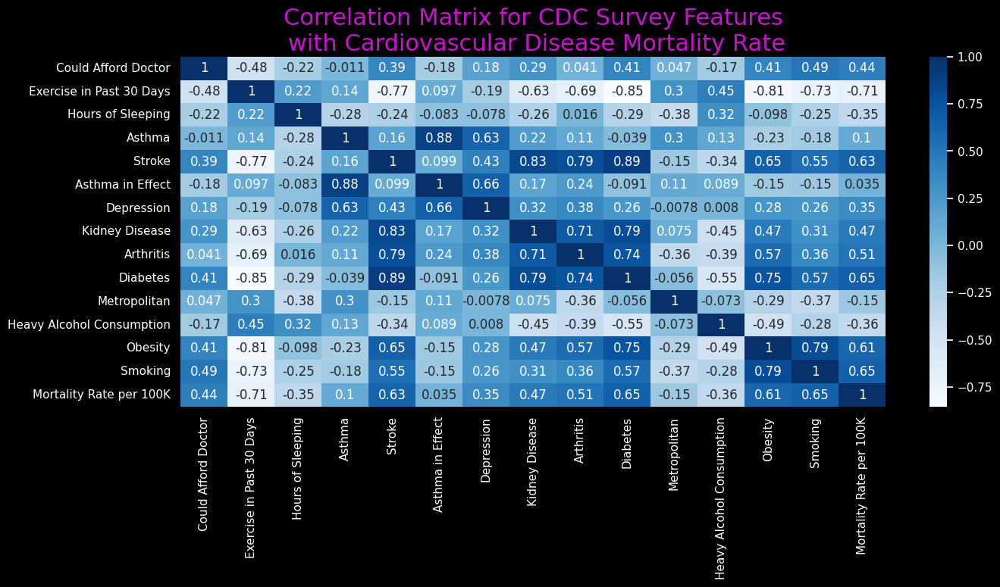

In [ ]:
corr = correlation_df.corr()
plt.style.use("dark_background")
plt.figure(figsize=(15,6))
sns.heatmap(corr, annot = True, cmap="Blues").set_title('Correlation Matrix for CDC Survey Features\n with Cardiovascular Disease Mortality Rate',fontsize=22,color=range_[3])
plt.show()

We can see that the top 5 correlations with cardiovascular disease are:

1.   Exercise in past 30 days : negatively correlated (-.71)
2.   Diabetes: positively correlated (.65)
3.   Smoking: positively correlated (.65)
4.   Stroke: positively correlated (.63)
5.   Obesity: positively correlated (.61)

Let's also visualize the relationsip between mortalities and these top factors. We use melting to transpose our dataframe so as to have each feature as a row. (Note: this was not included in our final report.)

In [ ]:
#Note this was not included in our report as it is redundant because we already have the linear regression charts
df_cdc_survey_melted_with_deaths = df_cdc_survey_state[['State Abbr.', 'Diabetes','Exercise in Past 30 Days', 'Smoking', 'Stroke', 'Obesity','Metropolitan']].melt(
    id_vars=['State Abbr.'], var_name='Feature', value_name='Percentage', ignore_index=True
    ).groupby(['State Abbr.','Feature']).mean().reset_index().merge(
        df_mortality_state_short_overall, how='inner', left_on=['State Abbr.'], right_on=['State']
        )
#Plotting chart excluding 'Metropolitan' since we didn't find high correlation, but we wanted still wanted the 'Metropolitan' in the DF for later charts so it is included
#in the df_cdc_survey_melted_with_deaths creation above
alt.Chart(df_cdc_survey_melted_with_deaths[df_cdc_survey_melted_with_deaths.Feature!='Metropolitan']).mark_circle(size=60).encode(
    x=alt.X("Percentage").title('Percentage'),
    y=alt.Y("Mortality Rate per 100K").title('Heart-related deaths'),
    color=alt.Color('Feature').scale(range=range_)
).properties(
        width=800,
        height=400,
        title='How Do Different Factors Affect Heart-Related Mortalities?'
)

alt.Chart(...)

Next, we will analyze these relations with simple linear regressions, plotted with 95% confidence intervals. Then we will create a bootstrap sampling distribution of the linear regression coefficients plotted with a 95% confidence interval to find a reasonable range for these coefficients.

 It is important to note that linear regressions assume that the data is homoscedastic. In other words this means that the variance of the error terms of the dependent variable is constant regardless of the value of the independent variables. Other assumptions include linearity of the relation, as well as an assumption that the residuals follow a normal distribution. Taking a rough glance at the charts, it seems that the variance seems to be somewhat constant, or at the very least we don't see dramatic changes of variance upon different x values. Thus we feel that it is appropriate to create linear regression visuals of the data.

In [ ]:
def create_lr_chart(feature):
    """
    Creates a scatter plot with fitted regression line including the 95% confidence interval bands.

    :param feature: Name of the independent variable.

    :return: Altair chart with all visualization elements.
    """
    feature_df=df_cdc_survey_melted_with_deaths[df_cdc_survey_melted_with_deaths['Feature']==feature]

    feature_chart=alt.Chart(feature_df).mark_point(size=10,fill="True",opacity=.7).encode(
        x=alt.X('Percentage',title=feature +' Percentage'),
        y=alt.Y('Mortality Rate per 100K',title='Mortality Rate per 100K'),
        tooltip=['State'],
        color=alt.value(range_[0])
        )

    feature_pred_grid=pd.DataFrame({'Percentage':np.linspace(feature_df['Percentage'].min(),feature_df['Percentage'].max(),100)})

    X=feature_df[['Percentage']]
    y=feature_df['Mortality Rate per 100K']
    lr=LinearRegression().fit(X,y)

    pred_df=pd.DataFrame({'x':feature_pred_grid['Percentage'],'y':lr.predict(feature_pred_grid)})

    feature_lr=alt.Chart(pred_df).mark_line(color=range_[1],opacity=.5).encode(
        x=alt.X('x',scale=alt.Scale(domain=[feature_df['Percentage'].min(),feature_df['Percentage'].max()])),
        y=alt.Y('y',scale=alt.Scale(domain=[feature_df['Mortality Rate per 100K'].min(),feature_df['Mortality Rate per 100K'].max()]))
        )

    #Next we create the 95% confidence intervals for the linear regression
    n=len(X)
    k=1
    #Calculating the std. dev. of the residuals
    s_y=np.sqrt(np.sum(np.square(y-lr.predict(X)))/(n-2))
    std=float(X.std())

    pred_df['upper bound']=pred_df['y']+t.ppf(.025,df=n-k-1)*s_y*np.sqrt(1/n+np.square(pred_df['x']-pred_df['x'].mean())/((n-1)*std))
    pred_df['lower bound']=pred_df['y']-t.ppf(.025,df=n-k-1)*s_y*np.sqrt(1/n+np.square(pred_df['x']-pred_df['x'].mean())/((n-1)*std))

    feature_int=alt.Chart(pred_df).mark_area(color=range_[0],opacity=.4).encode(
        x='x',
        y='upper bound',
        y2='lower bound'
        )
    return (feature_lr + feature_int + feature_chart).properties(title="Mortality Rate vs. " + feature)

In [ ]:
(create_lr_chart('Exercise in Past 30 Days') & create_lr_chart('Stroke') | \
   create_lr_chart('Diabetes') & create_lr_chart('Obesity') | create_lr_chart('Smoking') & create_lr_chart('Metropolitan')
).configure_title(fontSize=16).configure_axis(titleFontSize=16,labelFontSize=16)

alt.HConcatChart(...)

As we can see, there seems to be positive correlation between mortalities and diabetes, smoking, having a stroke history, and obesity. Exercise in past 30 days has a negative relationship with mortality. We also included a chart for the metropolitan variable to include more environmental factors. As we can see from the metropolitan chart, the data is fairly scattered and there doesn't seem to be much of a correlation either way as the line is close to horizontal. Let's analyze the coefficients of each of these charts by creating bootstrap sampling distributions of the linear regression coefficients, plotted with 95% confidence intervals.

In [ ]:
def coef_bootstrap_dist(feature):
    """
    Creates a bootstrap distribution plot for linear regression coefficient with mean and confidence bands.

    :param feature: Name of the independent variable.

    :return: Altair chart with all visualization elements.
    """
    feature_df=df_cdc_survey_melted_with_deaths[df_cdc_survey_melted_with_deaths['Feature']==feature]
    coef_list=[]
    random_state = np.random.RandomState(42)
    for i in range(1000):
        sample_df=feature_df.sample(n=len(feature_df),replace=True,random_state=random_state)
        X=sample_df[['Percentage']]
        y=sample_df['Mortality Rate per 100K']

        lr=LinearRegression().fit(X,y)
        coef=lr.coef_[0]
        coef_list.append(coef)

    coef_df = pd.DataFrame(data = {'coef' : coef_list})

    density_chart=alt.Chart(coef_df).transform_density(
        density='coef',
        as_=['coef', 'density']
    ).mark_area(color=range_[1],opacity=.4).encode(
        x=alt.X('coef', axis=alt.Axis(title="Coefficient Value")),
        y=alt.Y('density:Q', axis=alt.Axis(title="Density"))
    )


    boot_mean_chart = alt.Chart(coef_df).mark_rule(color=range_[3],strokeWidth=2).encode(x="mean(coef)")

    #Creating the confidence interval chart. Since we can't be sure that the the bootstrap sampling distribution is approximately
    #normal, we can use the percentile method to estimate the confidence interval.
    conf = np.percentile(coef_list, [2.5,97.5])

    #Using a confidence interval dataframe to make a confidence interval with error band marks.

    conf_chart = alt.Chart(pd.DataFrame({'conf': conf})
    ).mark_errorband(color=range_[0],opacity=.5,extent='ci').encode(
        x=alt.X('conf:Q',title='')
        )

    annotation= alt.Chart().mark_text(text=f'95% Confidence Int. \n {np.round(conf,1)}',dx=100,dy=-140,fontSize=17,color=range_[3],lineBreak='\n',fontWeight='bold')

    boot_chart =  (density_chart + conf_chart + boot_mean_chart + annotation).properties(title=f"BSD of {feature} Coefficient",width=300,height=300)
    return boot_chart

(coef_bootstrap_dist('Exercise in Past 30 Days') \
    #adding annotation
    + alt.Chart().mark_text(text='Mean of Distribution',fontSize=18,dx=80,dy=120,color=range_[3],fontWeight='bold')
    + alt.Chart().mark_point(shape='arrow',angle=315,size=275,color=range_[3],x=140,y=260)\
    & coef_bootstrap_dist('Stroke') | coef_bootstrap_dist('Diabetes') & coef_bootstrap_dist('Obesity') |\
    coef_bootstrap_dist('Smoking') & coef_bootstrap_dist('Metropolitan')
).configure_title(fontSize=26).configure_axis(titleFontSize=16,labelFontSize=16,gridColor='black')

alt.HConcatChart(...)

 Here we have created 95% confidence intervals for the bootstrap sampling distributions of the linear regression coefficients. To be more specific, if we constructed a confidence interval 100 times using this process, 95% of them would contain the "true" coefficient i.e. the coefficient that we would find if we had the entire population. The confidence intervals for the diabetes, smoking, stroke, and obesity coefficents all are strictly positive, while the confidence interval for the exercise in the past 30 days coefficient is strictly negative. If we examine the confidence interval for the metropolitan coefficient, it is both negative and positive. This highlights the utility of these confidence intervals as it shows us that we can't be confident whether there is a positive or negative correlation.

For our final analysis we will incorporate the features from the CDC survey dataset including gender and ethnicty in a multivariable linear regression to analyze possible causal relationships. First, let's choose the most relevant features via RFE (Recursive Feature Elimination).

In [ ]:
df_mortality_with_cdc_one_hot = pd.get_dummies(df_mortality_with_cdc_state_gender_race, columns=['Gender', 'Ethnicity'], drop_first=True)

input_cols = [col for col in df_mortality_with_cdc_one_hot.columns if col not in ['State','Mortality Rate per 100K','State Abbr.',
                                                                                  'locationdesc','y_lat','x_lon','Ethnicity'
                                                                                  ]
                                                                                  ]
train_X = df_mortality_with_cdc_one_hot[input_cols]
train_y = df_mortality_with_cdc_one_hot['Mortality Rate per 100K']

#Running with default parameters with random state = 42 for reproducibility. Since we are using a random forest regressor for our feature selection, we
#don't need to standardize our data
rfr = RandomForestRegressor(random_state=42)
select = RFECV(estimator=rfr, cv=3)
select = select.fit(train_X, train_y)

The top 10 most important features will be used as the basis for analysis.

In [ ]:
rfe_results = {
    'feature': np.array(input_cols)[select.support_],
    'importance': select.estimator_.feature_importances_
    }
rfe_results_df = pd.DataFrame.from_dict(rfe_results)
rfe_results_df = rfe_results_df.sort_values(by=['importance'], ascending=False)[:10]
rfe_results_df

,feature,importance
14,Gender_Male,0.168102
8,Arthritis,0.161108
4,Stroke,0.131577
16,Ethnicity_Black,0.122353
9,Diabetes,0.066401
13,Smoking,0.043549
6,Depression,0.042323
0,Could Afford Doctor,0.037227
10,Metropolitan,0.033820
5,Asthma in Effect,0.033018


We are now ready to run a multivariable linear regression with these important features.

In [ ]:
input_cols = list(rfe_results_df['feature'])
#input_cols_sd = [col + '_sd' for col in input_cols]
df_mortality_with_cdc_one_hot[input_cols] = StandardScaler().fit_transform(df_mortality_with_cdc_one_hot[input_cols])
df_mortality_with_cdc_one_hot_x = df_mortality_with_cdc_one_hot[input_cols]
df_mortality_with_cdc_one_hot_y = df_mortality_with_cdc_one_hot['Mortality Rate per 100K']
df_mortality_with_cdc_one_hot_x = sm.add_constant(df_mortality_with_cdc_one_hot_x)

#Renaming columns for table visualization
df_mortality_with_cdc_one_hot_x=df_mortality_with_cdc_one_hot_x.rename({'Gender_Male':'Gender: Male','Ethnicity_Asian and Pacific Islander':'Ethnicity: Asian/Pacific Islander',
                                                                        'Ethnicity_Black':'Ethnicity: Black','Ethnicity_Hispanic':'Ethnicity: Hispanic',
                                                                        'Ethnicity_White':'Ethnicity: White'
                                                                        },axis=1
                                                                       )

df_mortality_with_cdc_model = sm.OLS(df_mortality_with_cdc_one_hot_y, df_mortality_with_cdc_one_hot_x).fit()
get_model_results(df_mortality_with_cdc_model)

,coef,std err,t,P>|t|,[0.025,0.975]
Feature,,,,,,
Gender: Male,67.9255,5.718,11.880,0.000,56.687,79.164
Arthritis,51.5412,7.141,7.218,0.000,37.505,65.577
Ethnicity: Black,63.8261,5.159,12.372,0.000,53.686,73.967
Could Afford Doctor,-14.6374,4.758,-3.077,0.002,-23.989,-5.286
Metropolitan,-29.4831,5.084,-5.799,0.000,-39.477,-19.489
Asthma in Effect,-13.1223,5.969,-2.198,0.028,-24.855,-1.389


Coefficients of interest (according to the statistical significance at a P-value of 5%) in order of effect are:
*   Being male (POS effect)
*   Being a black individual (POS effect)
*   Having arthritis (POS effect)
*   Living in a metropolitan city (NEG effect)
*   Ability to afford a doctor (NEG effect)
*   Having asthma (NEG effect) - Note: Although statistically significant at a P-value of 5%, the higher end of the confidence band is close to zero so we decided not to include this in our findings


